
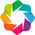

In [1]:
import pandas as pd
import numpy as np
import holoviews as hv
hv.extension('bokeh')


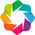

In [2]:
from simulations_code import analyze

In [3]:
analyze.get_timestamps()

array([1505954921, 1505977224, 1506004340, 1506049977, 1506053755,
       1506084039, 1506094228, 1506095238, 1506102046, 1506103068,
       1506117174, 1506119095, 1506120610, 1506123818, 1506126228,
       1506127563, 1506130075, 1506130832, 1506131554, 1506132302,
       1506133469, 1506134214, 1506134995, 1506135747, 1506136562,
       1506137379, 1506138210, 1506194431, 1506197192, 1506214201,
       1507176879, 1508029802])

In [4]:
all_sets = analyze.Simulations()

In [5]:
sets_df = all_sets.get_df()
sets_df.head()

,N,hour,last_value,last_value_diff,last_value_ratio
0,4,1,19477.813830,0.000000,1.000000
1,4,1,29012.013084,9534.199253,1.489490
2,4,2,28328.825276,8851.011446,1.454415
3,4,3,27758.191786,8280.377956,1.425118
4,4,6,26674.431694,7196.617863,1.369478


In [6]:
vdims = [('last_value', 'Last Value (USD)'), ('last_value_diff', 'Difference of Last Values'),
         ('last_value_ratio', 'Ratio of Last Values')]
ds = hv.Dataset(sets_df, kdims=('N', ('hour', 'Time in hours')), vdims=vdims)

In [7]:
ds.to(hv.Points, ['N', 'last_value_diff'])

:HoloMap   [hour]
   :Points   [N,last_value_diff]   (last_value,last_value_diff,last_value_ratio)

In [8]:
ds.to(hv.Points, ['hour', 'last_value_diff'])

:HoloMap   [N]
   :Points   [hour,last_value_diff]   (last_value,last_value_diff,last_value_ratio)

In [9]:
%%opts Points [width=800 height=400 tools=['hover'] legend_position='top_left']
ds.to(hv.Points, ['last_value_ratio', 'last_value_diff'], groupby='hour').overlay()

:NdOverlay   [hour]
   :Points   [last_value_ratio,last_value_diff]   (last_value,last_value_diff,last_value_ratio)

In [10]:
agg = ds.aggregate('N', function=np.mean, spreadfn=np.std)

In [11]:
hv.Curve(agg, vdims=['last_value_ratio']) * hv.ErrorBars(agg, vdims=['last_value_ratio', 'last_value_ratio_std'])

:Overlay
   .Curve.I     :Curve   [N]   (last_value_ratio)
   .ErrorBars.I :ErrorBars   [N]   (last_value_ratio,last_value_ratio_std)

In [12]:
%%opts Points [width=800 height=400 tools=['hover'] legend_position='top_left']
ds.to(hv.Points, ['N', 'last_value_diff'], groupby='hour').overlay()

:NdOverlay   [hour]
   :Points   [N,last_value_diff]   (last_value,last_value_diff,last_value_ratio)

In [13]:
df = analyze.load_all()

In [14]:
df.head()

timestamp      1505954921                                                    \
N                       4                                                     
hour                   1                           2             3       6    
is_baseline         False         True          False         False   False   
time                                                                          
0.0           9975.000000   9975.000000   9975.000000   9975.000000  9975.0   
3762.0       10336.663968  10337.368357           NaN           NaN     NaN   
7362.0       10323.858469  10309.767341  10307.747723           NaN     NaN   
10962.0      10224.487481  10173.539768           NaN  10172.493014     NaN   
14562.0      10008.976578   9952.370377   9994.278209           NaN     NaN   

timestamp                      1505977224                              \
N                                       4                               
hour             12      24            1                           2    
is_baseline   False   False         False         True          False   
time                                                                    
0.0          9975.0  9975.0   9975.000000   9975.000000   9975.000000   
3762.0          NaN     NaN  10054.871587  10055.569305           NaN   
7362.0          NaN     NaN  10507.424636  10503.415656  10501.348299   
10962.0         NaN     NaN  10460.704552  10407.413506           NaN   
14562.0         NaN     NaN  10177.886512  10128.410001  10180.179529   

timestamp      ...     1507176879                       1508029802  \
N              ...              4                                4   
hour           ...             6         12        24           1    
is_baseline    ...          False     False     False        False   
time           ...                                                   
0.0            ...       9949.875  9949.875  9949.875  9974.937500   
3762.0         ...            NaN       NaN       NaN  9818.715078   
7362.0         ...            NaN       NaN       NaN  9804.611240   
10962.0        ...            NaN       NaN       NaN  9801.609731   
14562.0        ...            NaN       NaN       NaN  9670.074389   

timestamp                                                                   \
N                                                                            
hour                                2             3          6          12   
is_baseline         True         False         False      False      False   
time                                                                         
0.0           9950.000000  9974.937500   9974.937500  9974.9375  9974.9375   
3762.0        9793.715234          NaN           NaN        NaN        NaN   
7362.0       10204.629264  9804.595459           NaN        NaN        NaN   
10962.0      10169.034712          NaN  10194.034556        NaN        NaN   
14562.0      10020.554626  9670.060584           NaN        NaN        NaN   

timestamp               
N                       
hour                24  
is_baseline      False  
time                    
0.0          9974.9375  
3762.0             NaN  
7362.0             NaN  
10962.0            NaN  
14562.0            NaN  

[5 rows x 224 columns]

In [15]:
df.tail()

timestamp   1505954921                                     1505977224        \
N                    4                                              4         
hour                1           2     3     6     12    24         1          
is_baseline      False True  False False False False False      False True    
time                                                                          
5033536.0          NaN   NaN   NaN   NaN   NaN   NaN   NaN        NaN   NaN   
5037136.0          NaN   NaN   NaN   NaN   NaN   NaN   NaN        NaN   NaN   
5040736.0          NaN   NaN   NaN   NaN   NaN   NaN   NaN        NaN   NaN   
5044336.0          NaN   NaN   NaN   NaN   NaN   NaN   NaN        NaN   NaN   
5047936.0          NaN   NaN   NaN   NaN   NaN   NaN   NaN        NaN   NaN   

timestamp          ...  1507176879               1508029802                \
N                  ...           4                        4                 
hour           2   ...          6     12    24           1                  
is_baseline False  ...       False False False        False         True    
time               ...                                                      
5033536.0     NaN  ...         NaN   NaN   NaN  6966.531217  41027.415040   
5037136.0     NaN  ...         NaN   NaN   NaN  7019.837646  42063.950330   
5040736.0     NaN  ...         NaN   NaN   NaN  6865.998247  43948.434980   
5044336.0     NaN  ...         NaN   NaN   NaN  6647.632614  40364.616814   
5047936.0     NaN  ...         NaN   NaN   NaN  6588.850650  39969.633328   

timestamp                                                          
N                                                                  
hour                   2             3             6     12    24  
is_baseline         False         False         False False False  
time                                                               
5033536.0    12210.392288  25310.921443  31499.750896   NaN   NaN  
5037136.0             NaN           NaN           NaN   NaN   NaN  
5040736.0    12044.860350           NaN           NaN   NaN   NaN  
5044336.0             NaN  25010.153656           NaN   NaN   NaN  
5047936.0    11558.133645           NaN           NaN   NaN   NaN  

[5 rows x 224 columns]

In [33]:
analyze.points(df, 1508029802, 4, 1, False) * analyze.points(df, 1508029802, 4, 1, True)

:Overlay
   .Points.I  :Points   [x,y]
   .Points.II :Points   [x,y]

In [17]:
holos = analyze.get_holomap(df)

In [18]:
holos

:HoloMap   [timestamp,N,hour,is_baseline]
   :Points   [x,y]

In [ ]:
ds